### Primer paso

Renombrar imágenes originales
Copiar las imágenes desde la carpeta temporal a la carpeta final

In [18]:
import datetime  #Manejo de fechas
import os        #Uso de rutas y comandos de sistema
import shutil    #Copiar imágenes entre carpetas

import matplotlib.pyplot as plt   #Mostrar imágenes
import matplotlib.image as mpimg  #Mostrar imágenes

import numpy as np
import pandas as pd

In [ ]:
def change_names(old_name, new_name):
    '''
    Función para cambiar el nombre a imágenes
    '''
#     print("OLD: ", old_name)
#     print("NEW: ", new_name)

    old_path = os.path.join(os.getcwd()+'\camera_images', old_name+".JPG")
    new_path = os.path.join(os.getcwd()+'\camera_images', new_name+".JPG")
    os.rename(old_path, new_path)

In [ ]:
def update_image_names():
    # Año, mes, día
    day = datetime.datetime(2021, 11, 12)
    first_image_str = "_DSC0"
    first_image_int = 368


    # Primer dia
        # Mañana
    # print(day.strftime("%Y%m%d")+"0"+"0")
    change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"0"+"0")
    first_image_int += 1
    change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"0"+"1")

        # Tarde
    first_image_int += 1
    change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"1"+"0") 
    first_image_int += 1
    change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"1"+"1")

    # Segundo dia en adelante
    for i in range(0,9):
        day = day + datetime.timedelta(days=1)
            # Mañana
        first_image_int += 1
        change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"0"+"0")
        first_image_int += 1
        change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"0"+"1")
            # Tarde
        first_image_int += 1
        change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"1"+"0")
        first_image_int += 1
        change_names(first_image_str+str(first_image_int), day.strftime("%Y%m%d")+"1"+"1")

In [13]:
def copy_images(from_dir, to_dir):
    
    for image in os.listdir(from_dir):
        shutil.copy2(os.path.join(from_dir,image), os.path.join(to_dir,image))

### Segundo paso 

Modificación de imágenes

In [31]:
def load_img(url):
    '''
    Function for loading an image from local drive. 
    Parameters: 
        url: location of the image to be read. 
    Return: 
        img: tensor of shape (height, width, channels)
    '''
    img = mpimg.imread(url)
    return img

def create_tale_name(img_name, tale_counter):
    '''
    Function for creating an exclusive name for each tale img. 
    Parameters: 
        img_name = original image name
        tale_counter = apple identificator
    '''
    return img_name + "{:04d}".format(tale_counter)+".jpg"

def crop(image, point, new_shape):
    '''
    Function for cropping an image: Given an image cropping point and tale shape.
    Parameters:
        image: image tensor of shape (height, width, channels)
        point: middle point of the new tale to crop the img
        new_shape: Size object with the shape you want x to have
    Return: 
        cropped_image: a tale extracted from the original image
    '''
    
    # Floor division = //
    point_height = point[0]
    point_width = point[1]
    
    top = point_height - new_shape[0] // 2
    bottom = top + new_shape[0]
    left = point_width - new_shape[1] // 2
    right = left + new_shape[1]
    
    cropped_image = image[top:bottom, left:right, :]
    
    return cropped_image



def load_txt(file):
    df = pd.read_csv(file, sep=' ',header=0)
    print(df)
    
    
def add_row_txt(file, row_info):
    row = pd.DataFrame(row_info).T
    row.to_csv(file, mode='a',sep = ' ', header = False, index = False)
    
    
    
def read_last_evol_landmark(file):
    df = pd.read_csv(file, sep=' ',header=0)
    return df["evol_landmark"].iloc[-1]


def read_last_apple_id(file):
    df = pd.read_csv(file, sep=' ',header=0)
    return df["apple_id"].iloc[-1]


def generate_tales(apples_rows, apples_cols, img_name, apples_id_count, evol_landmark, data_file):
    fig=plt.figure(figsize=(10, 10))
    rows=apples_rows
    columns=apples_cols

    img = load_img('./original_images/'+img_name+'.jpg')

    new_height = img.shape[0] // apples_rows
    new_width = img.shape[1] // apples_cols
    new_shape = (new_height, new_width)

    tale_counter = 0

    for row in range(1, apples_rows*2, 2):
        for col in range(1, apples_cols*2, 2):

            point_height = (img.shape[0] // (apples_rows*2)) * row
            point_width = (img.shape[1] // (apples_cols*2)) * col
            point = (point_height, point_width)

            tale = crop(img, point, new_shape)    
            tale_counter += 1

            fig.add_subplot(rows, columns, tale_counter)
            plt.imshow(tale)
            
            apple_id = tale_counter + apples_id_count
            image_name = create_tale_name(img_name, apple_id)
            # print(image_name)

            path = os.getcwd()+'\images_dataset'
            mpimg.imsave(os.path.join(path, image_name), tale, format='jpg')
            
            add_row_txt(data_file,(image_name, apple_id, evol_landmark))
            
            #print("Height: ", point_height, "Width: ", point_width)

    plt.show()

In [54]:
#img shape = (1000, 1400, 3) = (height, width, channels)

def apple_processing():
    '''
    ORIGINAL Image name: yyyymmddT
        date = yyyymmdd (20210611)
        morning/evening = T (0)/(1)

    TALE Image name: yyyymmddTCAAAA
        date = yyyymmdd (20210611)
        morning/evening = T (0)/(1)
        container = T (0)/(1)
        apple_id = A (0000)Up to 9999 different apples
    '''

    DATA_FILE = os.path.join(os.getcwd()+"\images_dataset", "list_attr_apples.txt")
    
    # Count (+6): (0,6) , (12, 18) , (24, 30), (36, 42) ,...
    APPLES_ID_COUNT_A = read_last_apple_id(DATA_FILE)
    APPLES_ID_COUNT_B = APPLES_ID_COUNT_A + 6

    first_img_name = os.listdir(os.getcwd()+'\camera_images')[0][0:8]

    date = datetime.datetime(int(first_img_name[0:4]), int(first_img_name[4:6]), int(first_img_name[6:8]))
    
    for i in range(0,10):
        
        img_name = date.strftime("%Y%m%d")
        
        tupper_0 = img_name+'0'+'0'
        tupper_1 = img_name+'0'+'1'

        apples_rows = 2
        apples_cols = 3

        evol_landmark = read_last_evol_landmark(DATA_FILE) 

        if evol_landmark==19:
            evol_landmark = 0
        else:
            evol_landmark += 1

        generate_tales(apples_rows, apples_cols, tupper_0, APPLES_ID_COUNT_A, evol_landmark, DATA_FILE)
        generate_tales(apples_rows, apples_cols, tupper_1, APPLES_ID_COUNT_B, evol_landmark, DATA_FILE)

        evol_landmark += 1
        tupper_0 = img_name+'1'+'0'
        tupper_1 = img_name+'1'+'1'

        generate_tales(apples_rows, apples_cols, tupper_0, APPLES_ID_COUNT_A, evol_landmark, DATA_FILE)
        generate_tales(apples_rows, apples_cols, tupper_1, APPLES_ID_COUNT_B, evol_landmark, DATA_FILE)

        date = date + datetime.timedelta(days=1)
        #load_txt(DATA_FILE)



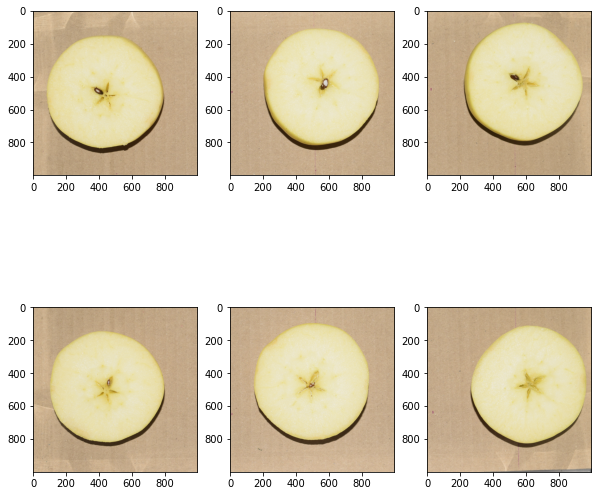

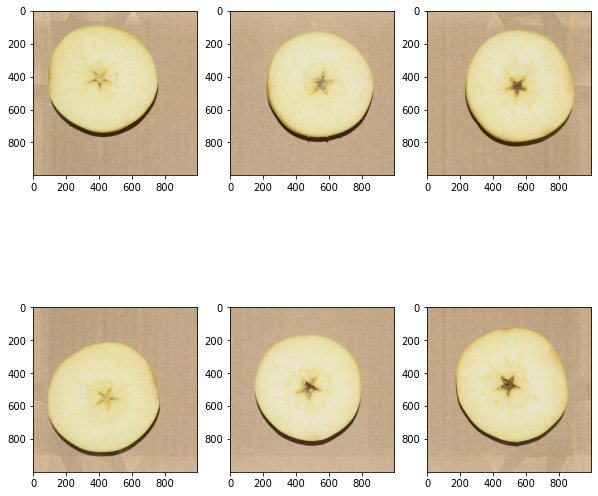

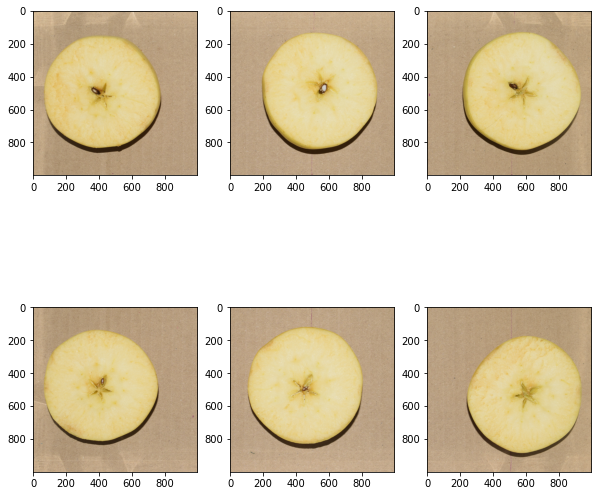

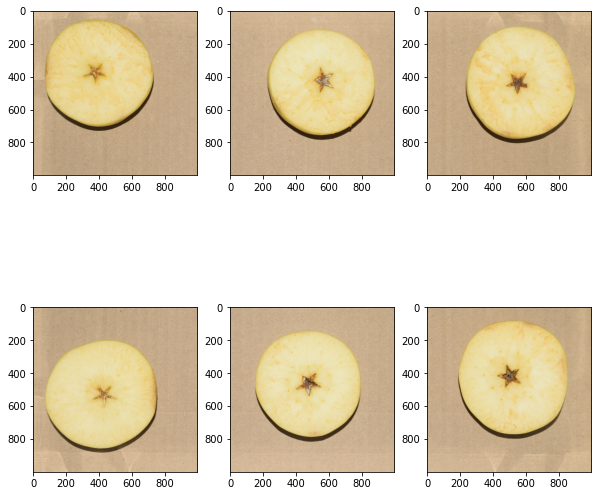

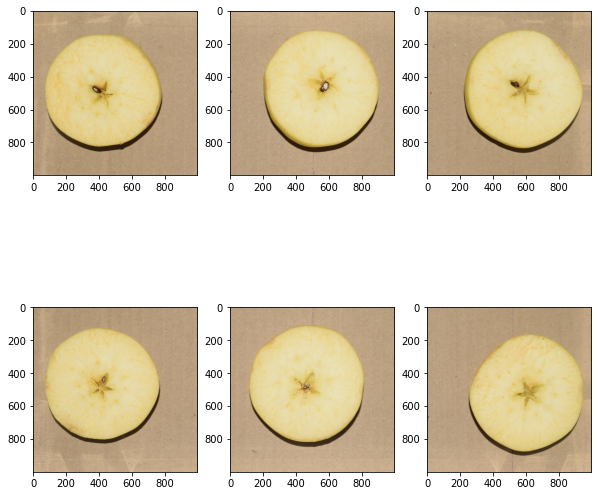

...

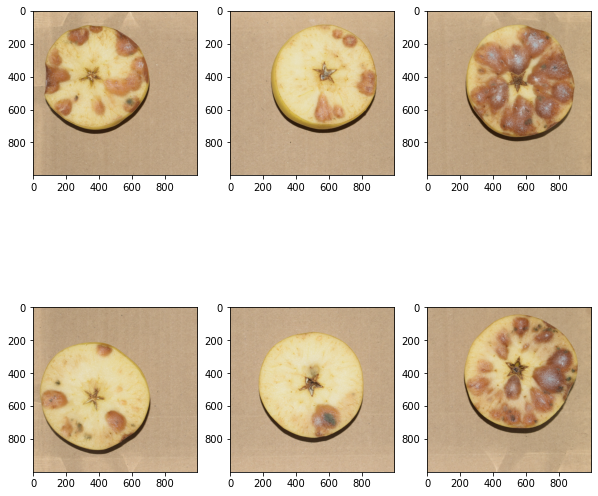

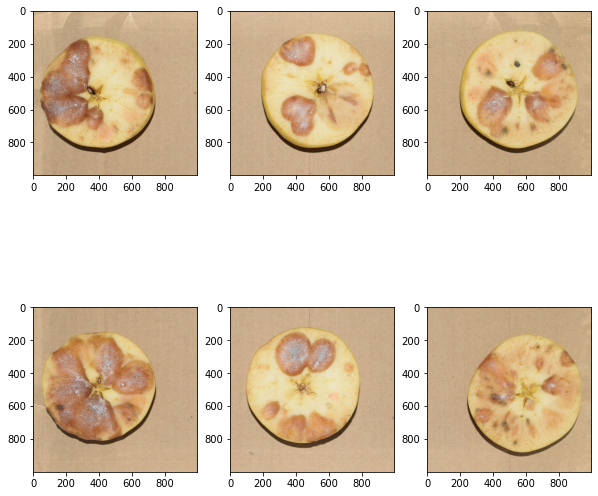

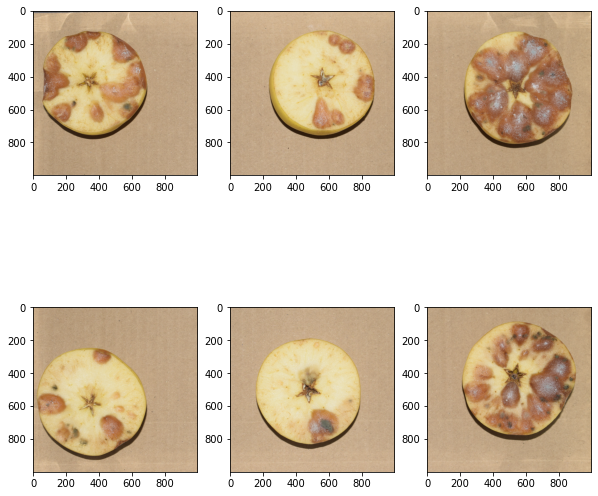

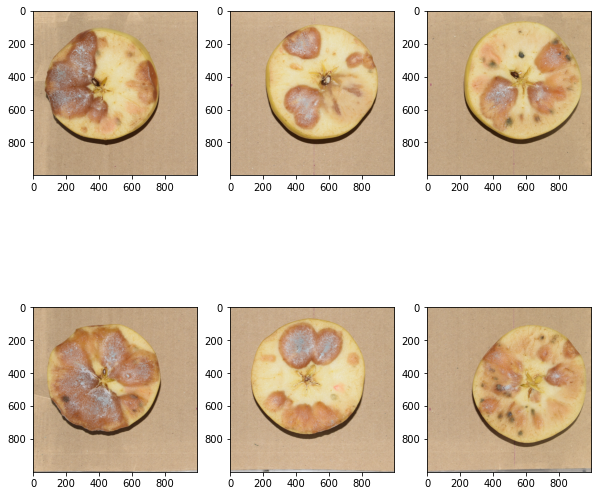

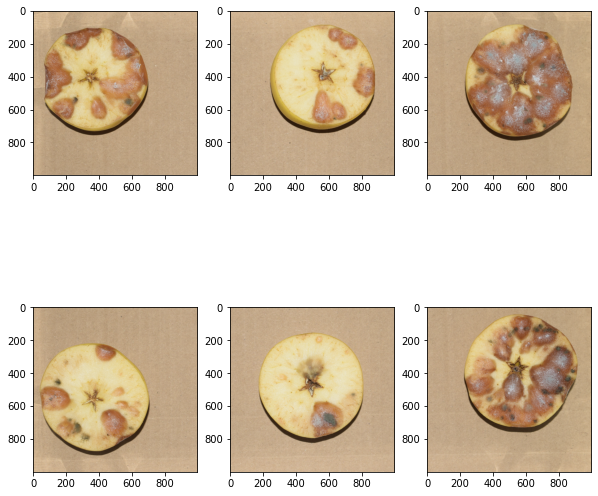

In [55]:
apple_processing()

#### ORIGINAL Image name: yyyymmddT
    date = yyyymmdd (20210611)
    morning/evening = T (0)/(1)

#### TALE Image name: yyyymmddTAAAA
    date = yyyymmdd (20210611)
    morning/evening = T (0)/(1)
    apple_id = A (0000)Up to 9999 different apples
    
#### Example
    Original morning = 202106110
        Apple_0 = 2021061100000 
        Apple_1 = 2021061100001
        Apple_2 = 2021061100002
        Apple_3 = 2021061100003
        ...
        Apple_9999 = 2021061109999
        
    Original evening = 202106111
        Apple_0 = 2021061110000 
        Apple_1 = 2021061110001
        Apple_2 = 2021061110002
        Apple_3 = 2021061110003
        ...
        Apple_9999 = 2021061119999

### Ejecución

In [29]:
print("INICIANDO PROCESO \n")

print("Inicio cambio de nombre a imágenes originales")
# update_image_names()
# copy_images(os.getcwd()+'\camera_images', os.getcwd()+'\original_images')
print("Fin cambio de nombre a imágenes originales \n")

print("Inicio de procesado de imágenes")
# apple_processing()
print("Fin de procesado de imágenes \n")


INICIANDO PROCESO 

Inicio cambio de nombre a imágenes originales
Fin cambio de nombre a imágenes originales 

Inicio de procesado de imágenes
Fin de procesado de imágenes 

